#Lab 7 - Scale Invariant "blob" keypoint detector.

Task: In this assignment you will code a scale invariant keypoint detector `ScaleInvDet` (Python class) that can detect circular or blob like regions in an image. The goal of the assignment is to build a detector so that the dark circular regions in the centres of the sunflowers at different scales in the image.
> The method `find_maxima` will return an N x 4 array containing the magnitude of the maxima, the x and y coordinates, and the scale the maximum is found at. This method should include an threshold value (as input argument to the method) called `thresh` to remove small maxima.
> You should also create an instance variable within the class `laplace_scale_space`. We can access the scale space and plot it to verify the scale space is correctly created. This will be an array of size  m x n x N, where N is the number of scales in the scale space (this is set by num_scales see below) and n and m are the spatial dimensions.

![](https://github.com/tonyscan6003/etivities/blob/main/blob_flowers.JPG?raw=true)





In the class that you will create, you will construct a Laplacian (of gaussian) scale space for the test image, and then seach this scale space for maxima that correspond to blobs in the image at different scales.


> **Step 1**:  Code a function that can generate kernel functions i.e. the 2nd order paratial derivatives of the gaussian function  $\frac{\partial^2{G(\mathbf{x},\sigma)}}{\partial{x}^2}$,$\frac{\partial^2{G(\mathbf{x},\sigma)}}{\partial{y}^2}$.

> **step 2**: Code a function that convolves the image with gaussian derivative kernels to produce the Laplacian of Gaussians for any value of sigma.

> **Step 3**: We will use the convolution function we have just written in a for loop to create the scale space images and assign them to an array. (This output array should be of dimension $n\times m \times k$ where $n$ and $m$ are the dimensions of the image and $k$ is the number of scales (`num_scales`)) The scale space images correspond to the stuctures in the original image. It should be evident (when viewing) that the reponse is maximised at particular scales and at particular locations in the image.

> **Step 4**: The next step is to find the exact location of the local maxima in x,y space and scale ( `find_maxima` method). This may be achieved by iterating though all of the scale space images and determining if each point in scale space is a local maximum by comparing it's magnitude with each of it's 26 nearest neighbours. You should be able to convince yourself with a simple 1d example (using 2 nearest neighbours) that this algorithm can find local maxima over all scales and positions.


Notes:
> **Computation of kernels:**
The Laplacian scale space (for a given sigma) is formed from convolution of the partial derivatives of the gaussian kernel with the input image.
It is however computationally inefficient to convolve these large 2d kernels with the image. *Therefore the gaussian partial derivative kernels should be instead determined as seperable convoutions*. That is 2 sequential convolutions with 1d kernels.

> The gaussian 1d forms including the 1st and 2nd order derivatives can be found [here](http://www.sci.utah.edu/~gerig/CS7960-S2010/handouts/04%20Gaussian%20derivatives.pdf). The 2nd order gaussian partial derivative are formed from the outer product of a 1d zero order gaussian and 2nd order derivative.

> When generating 1d gaussian kernels it is necessary to ensure there are enough samples in the window for the gaussian to decay to zero (see lecture 1_1). With larger sigma values bigger kernels are needed. The code snippet below gives the range of samples needed for generating gaussian kernels of different sizes.

    k_size = int(6*sigma+1)
    rng = (k_size-1)//2
    x = np.arange(-rng,rng+1)

> **Finding Maxima** The first and last images in the scale space are treated as auxillary images (i.e. These scale spaces are only used to assist in the determination of maxima of the 2nd and 2nd last layers.)

Useful Information:

> Seperable convolutions: Lecture 1_1 & [here](http://www.songho.ca/dsp/convolution/convolution2d_separable.html)

> [Scipy 2d Convolution command](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.convolve2d.html) (can be used with 1xn arrays as well as m x n):

> Numpy expand dims can be used to turn a list into an array

> Numpy transpose can be used to obtain transpose of an array

> Numpy [np.dstack](https://docs.scipy.org/doc/numpy/reference/generated/numpy.dstack.html) can be used to stack the scale space images produced as the image is convolved with larger scale gaussian kernels

> The [TQMD package](https://pypi.org/project/tqdm/) can be used to create a progress bar. You may find this useful to include with for any for loops used in creating the scale space and maxima detection.


#Housekeeping
Import Packages and read test Image.

In [32]:
import numpy as np
import urllib.request
import cv2
import numpy as np
from matplotlib import pyplot as plt
import math
from scipy import signal
from tqdm import tqdm
import os
from urllib.parse import urlparse

In [33]:


# function to read images from Web addresses.
def download_image(url, save_path):
    """
    Downloads an image from a URL and saves it to disk.
    If the image already exists at the specified path, it is read from disk.

    Args:
        url (str): URL of the image.
        save_path (str): Path to save the image on disk.

    Returns:
        None
    """
    # Parse the URL to get the filename
    filename = os.path.basename(urlparse(url).path)
    image_path = os.path.join(save_path, filename)

    # Check if the image already exists
    if os.path.exists(image_path):
        print(f"Image already exists at {image_path}. Reading from disk.")
        image = cv2.imread(image_path)
    else:
        print(f"Downloading image from {url}...")
        resp = urllib.request.urlopen(url)
        temp_image = np.asarray(bytearray(resp.read()), dtype="uint8")
        temp_image = cv2.imdecode(temp_image, cv2.IMREAD_COLOR)
        temp_image = cv2.cvtColor(temp_image, cv2.COLOR_BGR2RGB)
        print(f"Image downloaded and saved at {image_path}.")
        cv2.imwrite(image_path, temp_image)
        image = cv2.imread(image_path)
    return image

# Function to normalise images for display
def norm_img(ip_img):
   norm_img = ip_img-np.min(ip_img)
   norm_img = norm_img/(np.max(ip_img)-np.min(ip_img))
   return norm_img

def read_image():
   # read Image
   sf =1
   image = download_image(image_url_flowers,save_path="./")
   #Scale Image by sf = 2
   x,y,z = np.shape(image)
   image_scale = cv2.resize(image, dsize=(int(y/sf), int(x/sf)), interpolation=cv2.INTER_CUBIC)
   #Convert to Greyscale
   gray = cv2.cvtColor(image_scale, cv2.COLOR_BGR2GRAY)
   return image_scale,gray

def plot_filter(A,B,sigma,i):
    title_val = np.round(sigma,decimals=1)
    ax = fig.add_subplot(SID.num_scales, 2, 2*(i+1)-1)
    ax.imshow(A,'gray')
    ax.title.set_text('LoG Image, Sigma Value = '+str(title_val))
    ax.axis('off')
    ax = fig.add_subplot(SID.num_scales, 2, 2*(i+1))
    ax.imshow(B,'jet')
    ax.title.set_text('Sq Norm Lapacian')

# Create Class

We set the scale space range with the parameters `sigma_min` and `sigma_max` (and spacing `scale_fac` ) these parameters are required as inputs to the class during intialisation (and are inclued in the skeleton code below to calculate a range of sigma values `sigma_vals ` that the scale space is calculated over.).

Define the Class `ScaleInvDet` in the code cell below.

The skeleton code contains the input arguments on intialisation of a new class object. A placeholder showing the I/O of the find_maxima method is included. It is also recommended to determine the scale space on initialisation, you will need to write the methods to perform this.

In [42]:
class ScaleInvDet:

    def __init__(self, image, sigma_min, sigma_max, scale_fac):
        self.sigma_min = sigma_min
        self.sigma_max = sigma_max
        self.scale_fac = scale_fac
        self.image = image
        self.num_scales = int((sigma_max - sigma_min)/scale_fac)
        self.sigma_vals = np.linspace(self.sigma_min, self.sigma_max, self.num_scales)
        self.laplace_scale_space = self.build_scale_space()

    def compute_laplacian(self, sigma):

        size = int(6*sigma + 1)
        if size % 2 == 0:
            size += 1
        rng = (size-1)//2
        x = np.arange(-rng, rng+1)
        gauss0 = (1 / (np.sqrt(2*np.pi) * sigma)) * np.exp(-(x**2)/(2*sigma**2))
        gauss2 = (1 / (np.sqrt(2*np.pi) * sigma**5)) * np.exp(-(x**2)/(2*sigma**2)) * (x-sigma)*(x+sigma)

        img_float = self.image.astype(float)
        conv1 = signal.convolve2d(img_float, np.expand_dims(gauss2, axis=0), mode='same', boundary='symm')
        conv2 = signal.convolve2d(conv1, np.expand_dims(gauss0, axis=1), mode='same', boundary='symm')
        conv3 = signal.convolve2d(img_float, np.expand_dims(gauss0, axis=0), mode='same', boundary='symm')
        conv4 = signal.convolve2d(conv3, np.expand_dims(gauss2, axis=1), mode='same', boundary='symm')
        return sigma**2 * (conv2 + conv4)

    def build_scale_space(self):
        space_accum = None
        for idx in tqdm(range(self.num_scales), desc="Creating Scale Space"):
            lap_img = self.compute_laplacian(self.sigma_vals[idx])
            if idx == 0:
                space_accum = lap_img[:, :, np.newaxis]
            else:
                space_accum = np.dstack((space_accum, lap_img))
        return space_accum

    def check_neighbors(self, i, j, k, threshold):
        val = self.laplace_scale_space[i, j, k]
        if val < threshold:
            return False
        block = self.laplace_scale_space[i-1:i+2, j-1:j+2, k-1:k+2]
        if val >= np.max(block):
            return [val, i, j, self.sigma_vals[k]]
        return False

    def find_maxima(self, threshold):
        maxima_array = np.empty((1, 4))
        ws = 3
        rows, cols = self.image.shape
        n_max = 0
        for k in tqdm(range(1, self.num_scales-1), desc="Finding Maxima"):
            for i in range(1, rows-ws):
                for j in range(1, cols-ws):
                    result = self.check_neighbors(i, j, k, threshold)
                    if result:
                        if n_max > 0:
                            maxima_array = np.concatenate((maxima_array, np.array([result])))
                        else:
                            maxima_array = np.array([result])
                        n_max += 1
        return maxima_array


# Evaluation

**1. Initialise Scale Invariant Detector**

**2. View Lapacian Scale Space**
 The function will plot the laplacian and the square of the laplacian (For this to work you must have assigned the scale space to the class variable `self.laplace_scale_space`).
 > Note that your laplacian scale space will contain both positive and negative values, but the plot function will automatically offset and scale the values for dispay
 > It is assumed with the code given here that the scale space is generated on intitalisation of the detector. If this is not the case you may have to run your detector or call a method to display the scale space before you can use the plot function below.

 **3. Find and Plot maxima**



Image already exists at ./sunflowers_temp.jpg. Reading from disk.


Finding Maxima: 100%|██████████| 31/31 [00:12<00:00,  2.50it/s]


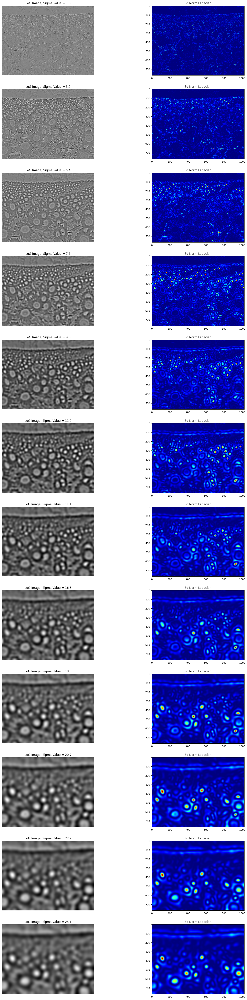

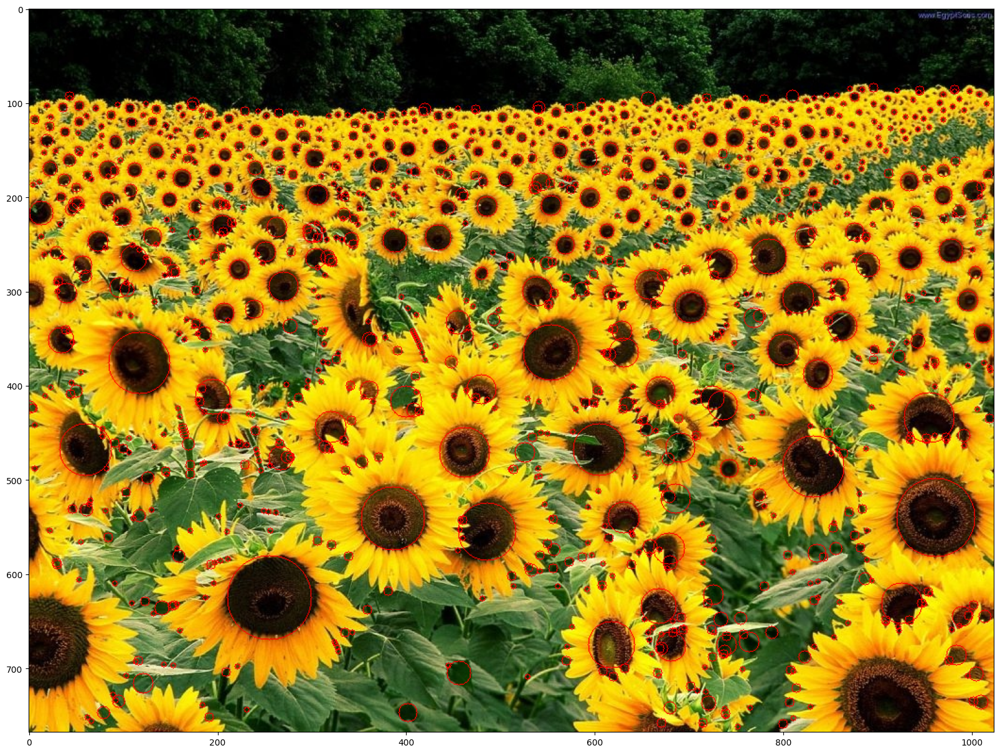

In [43]:
if __name__ == "__main__":
    # Import Test Image
    image_url_flowers = "https://github.com/tonyscan6003/etivities/blob/main/sunflowers_temp.jpg?raw=true"
    image_scale,gray = read_image() # Use gray scale for scale invariant detector

    # Parameterise Scale Space
    sigma_min = 1
    sigma_max = 36
    scale_fac = 1.05



    # Initialise Detector
    SID = ScaleInvDet(gray,sigma_min,sigma_max,scale_fac)


    fig = plt.figure(figsize=(20,200))
    ptr =0
    # View Laplacian Scale space
    for i in range(0,24,2):
        sigma = SID.sigma_vals[i]
        laplace_conv = SID.laplace_scale_space[:,:,i]
        # Obtain square norm
        sq_norm = laplace_conv**2
        # Call plotting
        plot_filter(laplace_conv,sq_norm,sigma,ptr)
        ptr+=1

    # Find maxima in image
    max_coords = SID.find_maxima(40)

    # sort in descending order (using magnitude)
    index_coords=np.argsort(max_coords[:,0],axis=0)[::-1]
    n_max = len(max_coords)
    for i in index_coords[0:n_max]:
        [mag,x,y,sigma] = max_coords[i,:]
        br =int(math.ceil(1.414 * sigma))
        keypoints_img = cv2.circle(image_scale, (int(y),int(x)), br, (255,0,0), 1)


    # Plot keypoint image
    plt.figure(figsize=(20,20))
    plt.imshow(keypoints_img)